In [1]:
import numpy as np 
import pandas as pd
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split,cross_val_score

In [2]:
df = pd.read_csv('train.csv')
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [3]:
X=df.iloc[:,1:]
y=df.iloc[:,0]

In [4]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [5]:
X_train.shape

(33600, 784)

In [6]:
X_test.shape

(8400, 784)

In [7]:
from sklearn.neighbors import KNeighborsClassifier

In [8]:
knn=KNeighborsClassifier()

In [9]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [10]:
import time 
start = time.time()
y_pred=knn.predict(X_test)
print(time.time()-start)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


19.808202981948853


In [11]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9648809523809524

## Applying PCA

In [12]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [13]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [14]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [15]:
from sklearn.decomposition import PCA
pca = PCA(n_components=200)

In [16]:
X_train_tf = pca.fit_transform(X_train)
X_test_tf = pca.transform(X_test)

In [17]:
X_train_tf.shape

(33600, 200)

In [18]:
X_test_tf.shape

(8400, 200)

In [19]:
knn = KNeighborsClassifier()

In [20]:
knn.fit(X_train_tf,y_train)

KNeighborsClassifier()

In [21]:
import time 
start = time.time()
y_pred = knn.predict(X_test_tf)
print(time.time()-start)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


17.531457662582397


In [22]:
accuracy_score(y_test,y_pred)

0.9507142857142857

## 2D Visualization

In [23]:
# transforming to a 2D coordinate system
pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [24]:
X_train_tf

array([[-2.71863247, -0.48982394,  1.13549679, ..., -0.05247715,
        -0.66571229, -1.56357288],
       [-0.67698014, -6.75362506, -2.33590162, ..., -0.05834273,
        -0.20654806,  0.14575416],
       [-3.03323288,  6.50981591,  7.49182995, ..., -0.20801456,
        -1.15196199, -0.47241855],
       ...,
       [ 2.14883649,  0.78079402, -0.74738797, ..., -1.00497032,
         1.19946799, -0.37695848],
       [ 1.05957005,  0.94767306,  3.94973123, ...,  0.62070868,
         0.42218803,  0.98258206],
       [17.70258447,  1.96188189, -4.94352839, ..., -0.47895781,
         0.21924175,  1.01630025]])

In [25]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                 y=X_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

## 3D Visualization

In [26]:
# transforming in 3D
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [27]:
X_train_tf

array([[-2.71863247, -0.48982394,  1.13549679, ..., -0.05247715,
        -0.66571229, -1.56357288],
       [-0.67698014, -6.75362506, -2.33590162, ..., -0.05834273,
        -0.20654806,  0.14575416],
       [-3.03323288,  6.50981591,  7.49182995, ..., -0.20801456,
        -1.15196199, -0.47241855],
       ...,
       [ 2.14883649,  0.78079402, -0.74738797, ..., -1.00497032,
         1.19946799, -0.37695848],
       [ 1.05957005,  0.94767306,  3.94973123, ...,  0.62070868,
         0.42218803,  0.98258206],
       [17.70258447,  1.96188189, -4.94352839, ..., -0.47895781,
         0.21924175,  1.01630025]])

In [28]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=X_train_trf[:,0], y=X_train_trf[:,1], z=X_train_trf[:,2],
              color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [29]:
pca.explained_variance_   #eigen values

array([40.67111198, 29.1702338 , 26.74459501])

In [30]:
pca.components_   #eigen vectors

array([[-2.94964441e-19, -4.80117349e-19, -1.71513303e-19, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 3.61389479e-17,  4.26982409e-18, -2.61266909e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-9.28710800e-17, -3.27428176e-17,  1.26164074e-18, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [31]:
pca.components_.shape

(3, 784)

In [32]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])

In [42]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [45]:
pca.explained_variance_.shape

(784,)

In [46]:
pca.components_.shape

(784, 784)

In [47]:
pca.explained_variance_ratio_.shape

(784,)

In [48]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

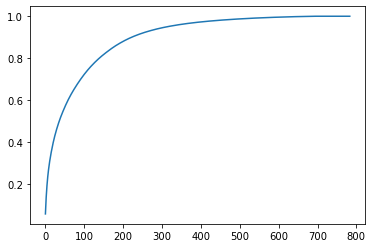

In [49]:
import matplotlib.pyplot as plt
plt.plot(np.cumsum(pca.explained_variance_ratio_))